<a href="https://colab.research.google.com/github/airctic/icedata/blob/master/notebooks/dev/plantdoc.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [87]:
!nvidia-smi

Fri Feb 12 12:03:28 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.39       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   40C    P0    33W / 250W |   6235MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Warning
This notebook is a work in progress document. We are sharing it with the IceVision Community through our Live Code Session (beginners-friendly). If you are interested in attending, please feel free to [join us](http://tinyurl.com/IceData)

## About the PlantDoc Dataset
PlantDoc is dataset for visual plant disease detection. It contains
2,598 data images with 13 plant species and 17 classesof diseases.

- Dataset [Repository](https://github.com/pratikkayal/PlantDoc-Object-Detection-Dataset)
- Paper: [PlantDoc: A Dataset for Visual Plant Disease Detection](https://arxiv.org/pdf/1911.10317.pdf)

# A Parser Example: Subclassing VOCBBoxParser parser
The PlantDoc Dataset provides both the VOC annoatation and a CSV annotation. 

> **Goal**: This notebook shows how to parse the PlantDoc dataset using 2 different methods:
- Using the Icevision default VOC parser
- Creating a new parser using the csv annotation file



## Installing IceVision

!!! warning "Google Colab Dependencies Incompatibilities "
    This issue is specific to Google Colab. The issue shouldn't occur on a local machine.
    Some of our external dependencies are not aligned with the dependencies pre-installed in Google Colab. 
    After pip installing both icevision and icedata (by runnning the cell here below), some errors will eventually pop up.
    To fix this issue, press the **RESTART RUNTIME** button.

In [88]:
# Instaling from GitHub master
!pip install git+git://github.com/airctic/icevision.git#egg=icevision[all] --upgrade

  Cloning git://github.com/airctic/icevision.git to /tmp/pip-install-0nc0lpne/icevision
  Running command git clone -q git://github.com/airctic/icevision.git /tmp/pip-install-0nc0lpne/icevision
  Running command git submodule update --init --recursive -q
  Created wheel for icevision: filename=icevision-0.6.0b1-cp36-none-any.whl size=165951 sha256=58bb4268a3178da858d90d9f52a682df6eafbbf3a458419d7bcde9029742cf68
  Stored in directory: /tmp/pip-ephem-wheel-cache-xypqtrae/wheels/ce/36/b9/5e4f774a28a04c32ca0ea7f7b20a8bd16d83bd8204e21ae25c
Successfully built icevision
  Found existing installation: icevision 0.6.0b1
    Uninstalling icevision-0.6.0b1:
      Successfully uninstalled icevision-0.6.0b1


## Imports

In [89]:
from icevision.all import *

## Clone the PlantDoc dataset repository


In [90]:
dataset_name = 'plantdoc'

In [91]:
!git clone https://github.com/pratikkayal/PlantDoc-Object-Detection-Dataset.git

Cloning into 'PlantDoc-Object-Detection-Dataset'...
remote: Enumerating objects: 5190, done.
remote: Total 5190 (delta 0), reused 0 (delta 0), pack-reused 5190
Receiving objects: 100% (5190/5190), 941.89 MiB | 19.70 MiB/s, done.
Resolving deltas: 100% (2328/2328), done.
Checking out files: 100% (5199/5199), done.


In [92]:
# Change current directory (use % instead of the usual !)
%cd PlantDoc-Object-Detection-Dataset/

/content/PlantDoc-Object-Detection-Dataset/PlantDoc-Object-Detection-Dataset


In [93]:
!ls

LICENSE.txt  TEST  test_labels.csv  TRAIN  train_labels.csv


In [94]:
import pandas as pd

# Read csv file. rename the "class" column with "label" to avoid conflicts
train_labels = pd.read_csv('train_labels.csv')
train_labels.rename(columns={'class':'label'}, inplace=True)
train_labels.sample(5)

,filename,width,height,label,xmin,ymin,xmax,ymax
8450,stock-photo-green-soy-leaves-in-the-field-agricultural-background-31501516.jpg,1500,1225,Soyabean leaf,298,310,712,802
5328,Stewarts-Leaf-Blight-Phase-24.jpg,444,185,Corn leaf blight,8,1,82,155
6038,5516100468998144.jpeg.jpg,600,800,Tomato Septoria leaf spot,236,508,386,589
702,soybean-potassium-deficiency-2.jpg,1000,831,Soyabean leaf,611,206,720,388
3378,04.jpg,844,1500,Bell_pepper leaf spot,281,468,526,651


In [95]:
len(train_labels)

8469

### Define class_map

PlantDoc: a dataset of 2,598 images across 13 plant species and 27 classes(17-10, disease-healthy)

In [96]:
# Get the classes 
_CLASSES = train_labels["label"].unique().tolist()
_CLASSES

['Cherry leaf',
 'Peach leaf',
 'Corn leaf blight',
 'Apple rust leaf',
 'Potato leaf late blight',
 'Strawberry leaf',
 'Corn rust leaf',
 'Tomato leaf late blight',
 'Tomato mold leaf',
 'Potato leaf early blight',
 'Apple leaf',
 'Tomato leaf yellow virus',
 'Blueberry leaf',
 'Tomato leaf mosaic virus',
 'Raspberry leaf',
 'Tomato leaf bacterial spot',
 'Squash Powdery mildew leaf',
 'grape leaf',
 'Corn Gray leaf spot',
 'Tomato Early blight leaf',
 'Apple Scab Leaf',
 'Tomato Septoria leaf spot',
 'Tomato leaf',
 'Soyabean leaf',
 'Bell_pepper leaf spot',
 'Bell_pepper leaf',
 'grape leaf black rot',
 'Potato leaf',
 'Tomato two spotted spider mites leaf']

In [97]:
class_map = ClassMap(_CLASSES)

In [98]:
class_map.get_by_name('Potato leaf early blight')

10

### Set images and annotations directories

In [13]:
data_dir = Path('./TRAIN')

images_dir = data_dir
annotations_dir = data_dir

In [14]:
images_dir.ls()

(#4720) [Path('TRAIN/corn-disease-update-fig-2-diplodia-leaf-streak1.jpg'),Path('TRAIN/pp1244-05.jpeg.jpg'),Path('TRAIN/16488048256_f64cfea40e_z.xml'),Path('TRAIN/IMG_1982.jpg'),Path('TRAIN/southernrust.xml'),Path('TRAIN/bacterial-speck-tomato-3.jpg'),Path('TRAIN/COURTESY_southernrust-greyleaf.jpg'),Path('TRAIN/Corn-Southern-Rust-7-17-F1.jpg'),Path('TRAIN/BacterialSpot08.xml'),Path('TRAIN/plant-rust-southern-rust-on-corn-leaf-plant-diseases-rust-of-wheat.xml')...]

## Method 1: Using icevision predefined VOC parser

### Note
The PlantDoc dataset uses the VOC annotation. Both the individual annotation files and the image files are located in the **./TRAIN** folder.

In [15]:
parser = parsers.voc(annotations_dir=annotations_dir, images_dir=images_dir, class_map=class_map)

In [16]:
train_records, valid_records = parser.parse()

  0%|          | 0/2356 [00:00<?, ?it/s]

WARNING  - Record with imageid: NCLB was skipped because: File 'TRAIN/NCLB.jpg' does not exist | icevision.parsers.parser:parse_dicted:87
WARNING  - Record with imageid: early-blight-1 was skipped because: File 'TRAIN/early-blight-1.jpg' does not exist | icevision.parsers.parser:parse_dicted:87
WARNING  - Record with imageid: powdery-mildew-on-squash-leaves was skipped because: File 'TRAIN/powdery-mildew-on-squash-leaves.jpg' does not exist | icevision.parsers.parser:parse_dicted:87
INFO     - Autofixing records | icevision.parsers.parser:parse:132
AUTOFIX-START - ️🔨  Autofixing record with imageid: 605  ️🔨 | icevision.core.record:_pre_replay:92
AUTOFIX-SUCCESS - Clipping bbox xmax from 3264 to image width 852 (Before: <BBox (xmin:1, ymin:1, xmax:3264, ymax:2443)>) | icevision.core.bbox:autofix:79
AUTOFIX-SUCCESS - Clipping bbox ymax from 2443 to image height 639 (Before: <BBox (xmin:1, ymin:1, xmax:852, ymax:2443)>) | icevision.core.bbox:autofix:86
AUTOFIX-START - ️🔨  Autofixing recor

In [17]:
train_records[0].bboxes

[<BBox (xmin:59, ymin:69, xmax:99, ymax:113)>,
 <BBox (xmin:8, ymin:206, xmax:62, ymax:277)>,
 <BBox (xmin:70, ymin:231, xmax:206, ymax:320)>,
 <BBox (xmin:45, ymin:158, xmax:92, ymax:227)>]

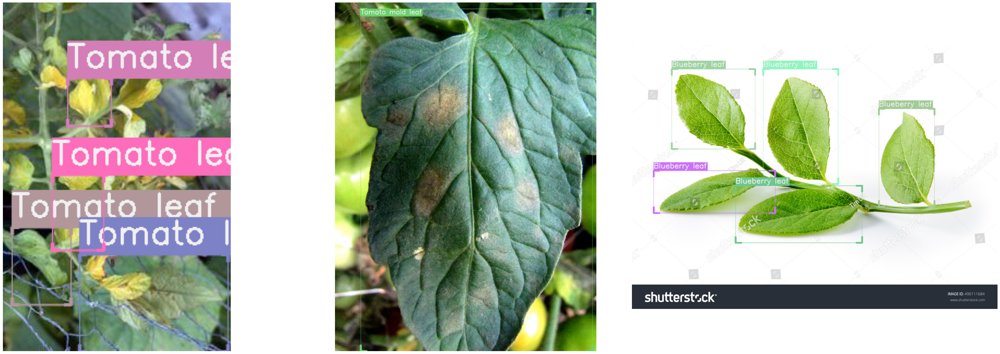

In [18]:
show_records(train_records[:3], ncols=3, class_map=class_map)

## Method 2: Creating a new parser from *scratch*

In [19]:
class PlantDocParser(parsers.FasterRCNN, parsers.FilepathMixin, parsers.SizeMixin):
    def __init__(self, df, source):
        super().__init__()
        self.df = df
        self.source = source

    # def chexk_file(self, ):

    def __iter__(self):
        yield from self.df.itertuples()

    def __len__(self):
        return len(self.df)  

    def imageid(self, o) -> Hashable:
        return Path(o.filename).stem

    def filepath(self, o) -> Union[str, Path]:
        return self.source / o.filename

    def image_width_height(self, o) -> Tuple[int, int]:
        return get_image_size(self.filepath(o))

    def labels(self, o) -> List[int]:
        return [class_map.get_by_name(o.label)]

    def bboxes(self, o) -> List[BBox]:
        xmin = o.xmin
        xmax = o.xmax
        ymin = o.ymin
        ymax = o.ymax
        return [BBox.from_xyxy(xmin, ymin, xmax, ymax)]

In [20]:
source = Path("./TRAIN")
parser_csv = PlantDocParser(train_labels, source=source)

In [21]:
train_records_csv, valid_records_csv = parser_csv.parse()

  0%|          | 0/8469 [00:00<?, ?it/s]

WARNING  - Record with imageid: NCLB was skipped because: File 'TRAIN/NCLB.jpg' does not exist | icevision.parsers.parser:parse_dicted:87
WARNING  - Record with imageid: NCLB was skipped because: File 'TRAIN/NCLB.jpg' does not exist | icevision.parsers.parser:parse_dicted:87
WARNING  - Record with imageid: early-blight-1 was skipped because: File 'TRAIN/early-blight-1.jpg' does not exist | icevision.parsers.parser:parse_dicted:87
WARNING  - Record with imageid: early-blight-1 was skipped because: File 'TRAIN/early-blight-1.jpg' does not exist | icevision.parsers.parser:parse_dicted:87
WARNING  - Record with imageid: early-blight-1 was skipped because: File 'TRAIN/early-blight-1.jpg' does not exist | icevision.parsers.parser:parse_dicted:87
WARNING  - Record with imageid: early-blight-1 was skipped because: File 'TRAIN/early-blight-1.jpg' does not exist | icevision.parsers.parser:parse_dicted:87
WARNING  - Record with imageid: early-blight-1 was skipped because: File 'TRAIN/early-blight

In [22]:
!ls TRAIN/NCLB.jpg

ls: cannot access 'TRAIN/NCLB.jpg': No such file or directory


In [23]:
train_records_csv[1].bboxes

[<BBox (xmin:1, ymin:3, xmax:384, ymax:481)>]

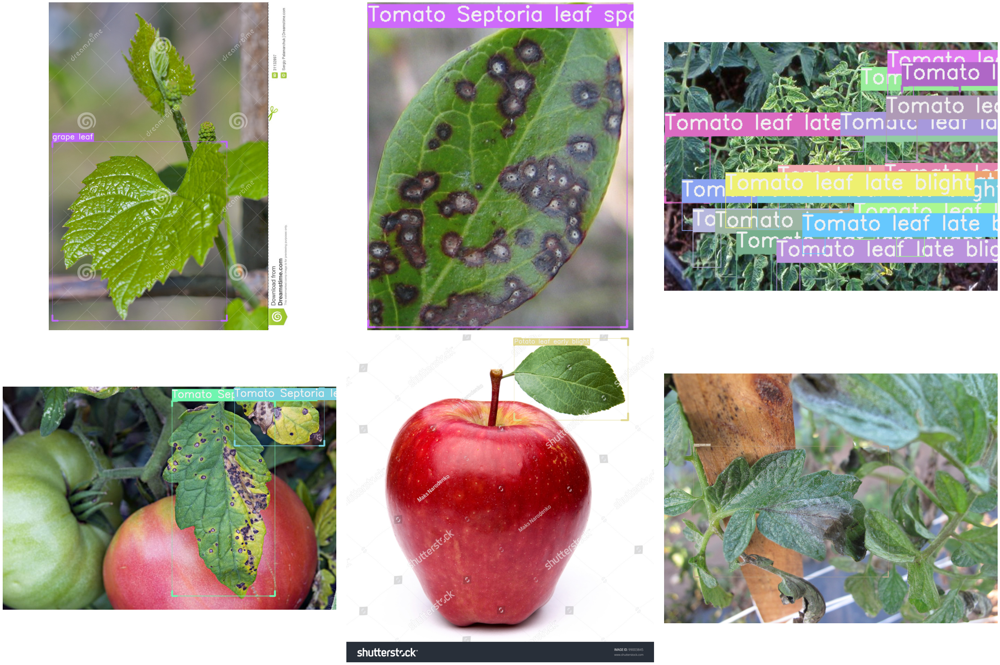

In [24]:
show_records(train_records_csv[:6], ncols=3, class_map=class_map)

### train and validation records

## Datasets
### Transforms

In [25]:
presize = 512
size = 384

train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=size, presize=presize), tfms.A.Normalize()])
# train_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size=size), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size=size), tfms.A.Normalize()])

### Train and Validation Dataset Objects

In [26]:
train_ds = Dataset(train_records_csv, train_tfms)
valid_ds = Dataset(valid_records_csv, valid_tfms)

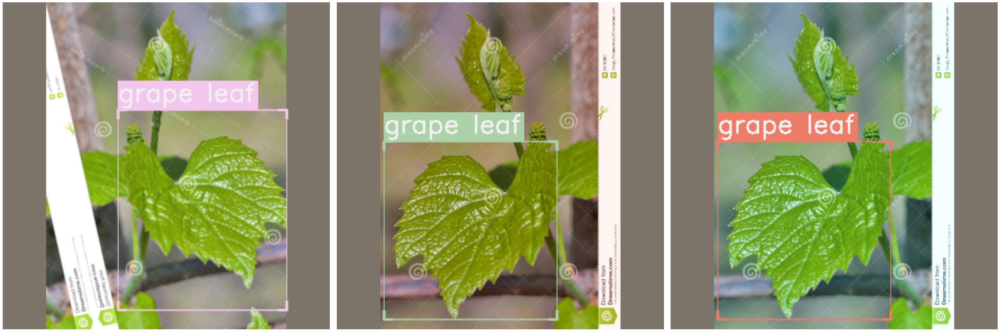

In [27]:
samples = [train_ds[0] for _ in range(3)]
show_samples(samples, class_map=class_map, denormalize_fn=denormalize_imagenet, ncols=3)

### DataLoaders

### Warning
As for now, EfficientDet doesn't work well for this dataset because some predictions return one-pixel or one-line bboxes. We need to further investigate that in order to find out the source of the problem and how it can be fixed

In [28]:
model_type = faster_rcnn # faster_rcnn # efficientdet

In [29]:
train_dl = model_type.train_dl(train_ds, batch_size=16, num_workers=4, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=16, num_workers=4, shuffle=False)

### Model

In [30]:
# model = model_type.model('tf_efficientdet_lite0', num_classes=len(class_map), img_size=size)
model = model_type.model(num_classes=len(class_map))

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


  0%|          | 0.00/160M [00:00<?, ?B/s]

In [54]:
import itertools
from typing import Dict, List, Tuple

import torch
import numpy as np

from icevision import BBox
from pytorch_lightning.metrics import ConfusionMatrix, Metric
from pytorch_lightning.loggers import wandb as pl_wandb
from torchvision.ops import box_iou
from icevision.metrics.metric import Metric as IceMetric

import wandb

class DetectedBBox(BBox):
    """Bounding Box coupled with label and confidence score.

    Should **not** be instantiated directly, instead use `from_*` methods.
    e.g. `from_xyxy`, `from_xywh`.
    Is able to transform coordinates into different formats,
    e.g. `xyxy`, `xywh`.

    # Examples

    Create from `xywh` format, and get `xyxy` coordinates.
    ```python
    bbox = BBox.from_xywh(1, 1, 4, 4)
    xyxy = bbox.xyxy
    ```
    """

    def __init__(self, xmin, ymin, xmax, ymax, score, label):
        if score > 1.0:
            raise RuntimeWarning(f"setting detection score larger than 1.0: {score}")
        if score < 0.0:
            raise RuntimeWarning(f"setting detection score lower than 0.0: {score}")
        self.score = score
        self.label = label
        super(DetectedBBox, self).__init__(xmin, ymin, xmax, ymax)

    @classmethod
    def from_xywh(cls, x, y, w, h, score, label):
        bbox = BBox.from_xywh(x, y, w, h)
        return cls(*bbox.xyxy, score, label)

    @classmethod
    def from_xyxy(cls, xl, yu, xr, yb, score, label):
        bbox = BBox.from_xyxy(xl, yu, xr, yb)
        return cls(*bbox.xyxy, score, label)

    @classmethod
    def from_relative_xcycwh(cls, xc, yc, bw, bh, img_width, img_height, score, label):
        bbox = BBox.from_relative_xcycwh(xc, yc, bw, bh, img_width, img_height)
        return cls(*bbox.xyxy, score, label)

    @classmethod
    def from_rle(cls, rle, h, w, score, label):
        bbox = BBox.from_rle(rle, h, w)
        return cls(*bbox.xyxy, score, label)



def zeroify_items_below_threshold(iou_scores:torch.Tensor, threshold:float) -> torch.Tensor:
    return iou_scores*(iou_scores>threshold).byte()


def couple_with_targets(predicted_bboxes, iou_scores) -> List:
    """Connects detected bounding boxes with ground truths by iou > 0"""
    ious_per_target = iou_scores.split(1, dim=1)
    return [list(itertools.compress(predicted_bboxes, iou.bool())) for iou in ious_per_target]


def pick_best_score_labels(predicted_bboxes, confidence_threshold: float = 0.5):
    # fill with dummy if list of predicted labels is empty
    BACKGROUND_IDX = 0
    dummy = DetectedBBox(0, 0, 0, 0, score=1.0, label=BACKGROUND_IDX)
    best_labels = []
    # pick the label that fits best given ground truth
    for ground_truth_predictions in predicted_bboxes:
        ground_truth_predictions = [
            prediction if prediction.score > confidence_threshold else dummy
            for prediction in ground_truth_predictions
        ]
        best_prediction = max(ground_truth_predictions, key=lambda x: x.score, default=dummy)
        best_labels.append(best_prediction.label)
    return best_labels


def pairwise_iou(predicted_bboxes, target_bboxes):
    stacked_preds = [bbox.to_tensor() for bbox in predicted_bboxes]
    stacked_preds = torch.stack(stacked_preds) if stacked_preds else torch.empty(0, 4)

    stacked_targets = [bbox.to_tensor() for bbox in target_bboxes]
    stacked_targets = torch.stack(stacked_targets) if stacked_targets else torch.empty(0, 4)
    return box_iou(stacked_preds, stacked_targets)

class SimpleConfusionMatrix(IceMetric):
    def __init__(self, confidence_threshold: float = 0.001, iou_threshold: float = 0.5):
        super(SimpleConfusionMatrix, self).__init__()
        self.ground_truths = []
        self.predictions = []
        self._confidence_threshold = confidence_threshold
        self._iou_threshold = iou_threshold
        self.labels = None

    def _reset(self):
        self.ground_truths = []
        self.predictions = []
        self.labels = None

    def accumulate(self, records, preds):
        # FIXME: a hack to temporarily not reset metrics after val loop
        if isinstance(self.ground_truths, np.ndarray): self._reset()
        if self.labels is None: self.labels = records[0]['class_map']._id2class
        for image_targets, image_preds in zip(records, preds):
            target_bboxes = image_targets['bboxes']
            target_labels = image_targets['labels']
            # skip if empty ground_truths
            if not target_bboxes: continue
            predicted_bboxes = [
                DetectedBBox(*bbox.xyxy, score=score, label=label)
                for bbox, score, label in zip(image_preds['bboxes'], image_preds['scores'], image_preds['labels'])
            ]
            # get torchvision iou scores (requires conversion to tensors)
            iou_scores = pairwise_iou(predicted_bboxes, target_bboxes)
            # TODO: see what happens if that_match is empty
            that_match = torch.any(iou_scores > self._iou_threshold, dim=1)
            iou_scores = iou_scores[that_match]
            iou_scores = zeroify_items_below_threshold(iou_scores, threshold=self._iou_threshold)

            # need to use compress cause list indexing with boolean tensor isn't supported
            predicted_bboxes = list(itertools.compress(predicted_bboxes, that_match))
            predicted_bboxes = couple_with_targets(predicted_bboxes, iou_scores)
            predicted_labels = pick_best_score_labels(predicted_bboxes, confidence_threshold=self._confidence_threshold)

            assert(len(predicted_labels) == len(target_labels))
            self.ground_truths.extend(target_labels)
            self.predictions.extend(predicted_labels)


    def finalize(self):
        assert(len(self.ground_truths) == len(self.predictions))
        self.ground_truths = np.array(self.ground_truths)
        self.predictions = np.array(self.predictions)
        return {'dummy_value_for_fastai': 'ok'}

    def log(self, logger_object) -> None:
        if isinstance(logger_object, pl_wandb.WandbLogger):
            wandb.sklearn.plot_confusion_matrix(y_true=self.ground_truths, y_pred=self.predictions, labels=self.labels)
            # logger_object.experiment.log({
            #     "conf_mat": wandb.plot.confusion_matrix(
            #         preds=self.predictions, y_true=self.ground_truths, class_names=self.labels)
            # })
        # self._reset()
        return

### Fastai Learner

In [55]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox, print_summary = True, show_pbar = False), SimpleConfusionMatrix()]

In [56]:
learn = model_type.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)

## Fastai Training
### Learning Rate Finder

SuggestedLRs(lr_min=1.0964781722577755e-07, lr_steep=9.12010818865383e-07)

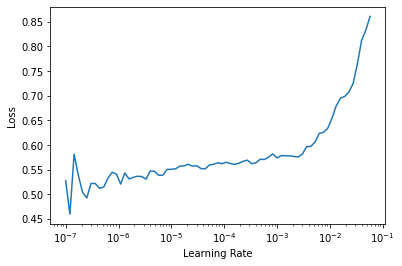

In [57]:
learn.freeze()
learn.lr_find()

### Fine tune: 2 Phases
- Phase 1: Train the head for 3 epochs while freezing the body
- Phase 2: Train both the body and the head during 50 epochs

In [58]:
fname_model_best = "plantdoc-efficientdet-best"

In [59]:
from fastai.callback.tracker import SaveModelCallback
learn.fine_tune(5, 0.00047, freeze_epochs=3)

epoch,train_loss,valid_loss,COCOMetric,SimpleConfusionMatrix,time
0,0.536498,0.560694,0.180597,ok,01:23
1,0.556285,0.581845,0.172703,ok,01:22
2,0.569949,0.583788,0.147845,ok,01:25


Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.181
Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.342
Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.159
Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.041
Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.095
Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.236
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.204
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.404
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.435
Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.138
Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.290
Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.534
Average Precision  (AP) @[ IoU=0.50:0.95 | area=   a

epoch,train_loss,valid_loss,COCOMetric,SimpleConfusionMatrix,time
0,0.540643,0.566995,0.168308,ok,01:58
1,0.558221,0.563269,0.174311,ok,01:58
2,0.528788,0.531169,0.196855,ok,01:58
3,0.475291,0.516702,0.206137,ok,01:58
4,0.454512,0.509018,0.216528,ok,01:58


Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.168
Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.330
Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.147
Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.034
Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.085
Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.229
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.190
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.390
Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.421
Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.084
Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.303
Average Recall     (AR) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.511
Average Precision  (AP) @[ IoU=0.50:0.95 | area=   a

## Show results

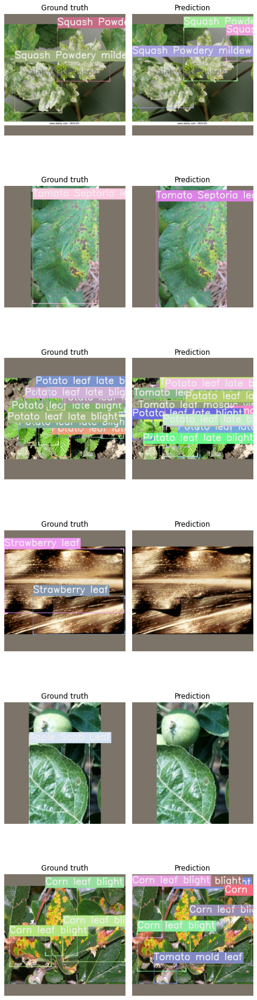

In [60]:
model_type.show_results(model, valid_ds, class_map=class_map)

In [61]:
cm = learn.metrics[1].metric

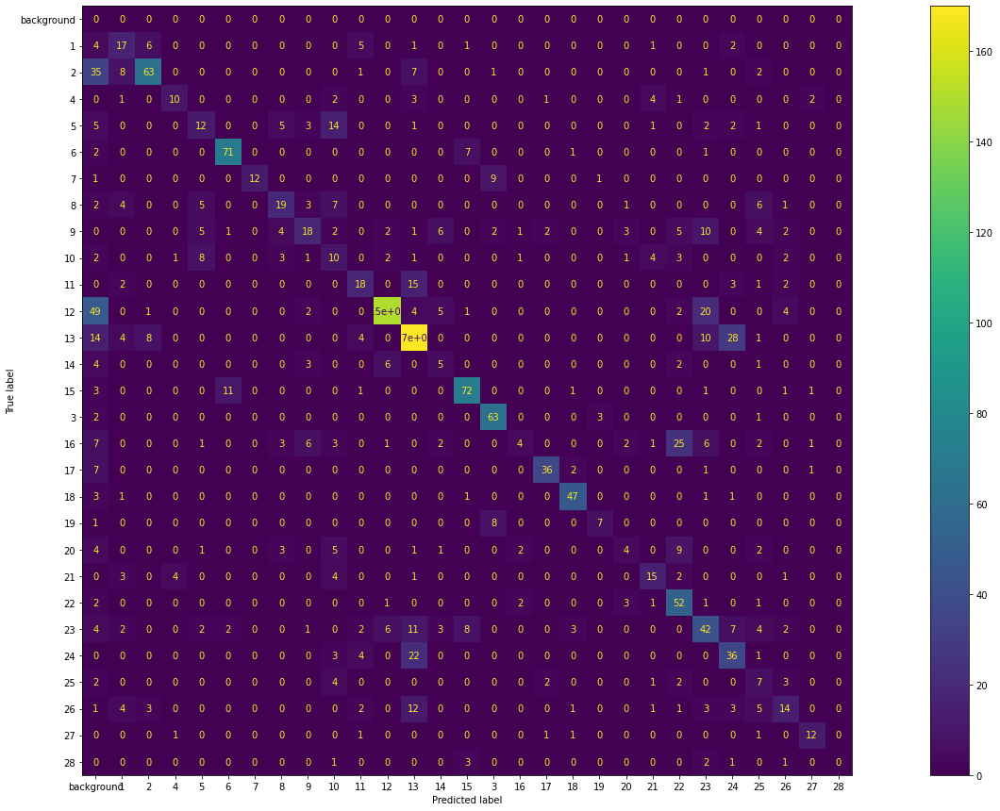

In [84]:
import sklearn
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1, 1, figsize=(30, 15))
confusion_matrix = sklearn.metrics.confusion_matrix(y_true=cm.ground_truths, y_pred=cm.predictions)
disp = sklearn.metrics.ConfusionMatrixDisplay(confusion_matrix, display_labels=cm.labels)
disp.plot(ax=ax)

## Saving a Model on Google Drive

>Note: In this example, we suppose you have already created a folder called **models** in your Google Drive

In [ ]:
## Mount your Google Drive
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
root_dir = Path('/content/gdrive/My Drive/')

### Saving the last model

In [ ]:
fname_model = "plantdoc-efficientdet.pth'
torch.save(model.state_dict(), root_dir/'models'/fname_model)

### Saving the best model

In [ ]:
!ls models

In [ ]:
!cp models/plantdoc-efficientdet-best.pth /content/gdrive/"My Drive"/models/plantdoc-efficientdet-best.pth

In [ ]:
??COCOMetric

## Happy Learning!

If you need any assistance, feel free to join our [forum](https://discord.gg/JDBeZYK).